# Задача 4. Ансамбли

- Найти данные размера хотя бы 10000, на которых можно решить задачу классификации или регрессии.
- Выполнить разведочный анализ (**EDA**). При необходимости выполнить полезные преобразования данных.
- Самостоятельно реализуйте алгоритмы **Bagging** и **AdaBoost**, которые позволят обучить ансамбли каких-то простых моделей, например деревьев принятия решений.
- Обучите ансамбли для каких-то простых моделей, используя свои две реализации, а также реализации из **sklearn** (**Bagging**, **Random Forest**, **AdaBoost**, **Gradient Tree Boosting**, **Histogram-Based Gradient Boosting**).
- При обучении использовать **подбор гиперпараметров**, **кросс-валидацию**.
- Сравнить качество моделей: замерить скорость обучения.
- (**+2 балла**) Также добавить в сравнение модели из библиотек **XGBoost**, **LightGBM** и **CatBoost**.
- (**+3 балла**) Для подбора гиперпараметров использовать фреймворк **Optuna**.


In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

import numpy.typing as npt
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.tree import DecisionTreeRegressor
from sklearn.utils.validation import check_X_y, check_scalar, check_random_state, check_is_fitted, check_array
from sklearn.utils.estimator_checks import check_estimator

# Датасет
Будем использовать базу [цен на дома в Индии](https://www.kaggle.com/datasets/anmolkumar/house-price-prediction-challenge?datasetId=902117&sortBy=voteCount&language=Python&select=train.csv).

In [3]:
raw_df = pd.read_csv('res/House_Price.csv')

На данных предполагается решать задачу регрессии: определить цену на жилье в Индии.

### Описание атрибутов:
#### Нецелевые
- POSTED_BY --- кто предоставил объявление (застройщик, владелец, дилер)
- UNDER_CONSTRUCTION --- строится или нет
- RERA --- одобрено ли организацией по недвижимости
- BHK_NO --- количество комнат
- BHK_OR_RK --- тип недвижимости
- SQUARE_FT --- общая площадь дома в квадратных футах
- READY_TO_MOVE --- готов к переезду или нет
- RESALE --- перепродажа или нет
- ADDRESS --- адрес недвижимости
- LONGITUDE --- долгота собственности
- LATITUDE --- широта собственности
#### Целевые
- TARGET --- цена жилья (PRICE_IN_LACS)

In [3]:
raw_df.describe()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET
count,29451.000000,29451.000000,29451.000000,2.945100e+04,29451.000000,29451.000000,29451.000000,29451.000000,29451.000000
mean,0.179756,0.317918,2.392279,1.980217e+04,0.820244,0.929578,21.300255,76.837695,142.898746
std,0.383991,0.465675,0.879091,1.901335e+06,0.383991,0.255861,6.205306,10.557747,656.880713
min,0.000000,0.000000,1.000000,3.000000e+00,0.000000,0.000000,-37.713008,-121.761248,0.250000
25%,0.000000,0.000000,2.000000,9.000211e+02,1.000000,1.000000,18.452663,73.798100,38.000000
50%,0.000000,0.000000,2.000000,1.175057e+03,1.000000,1.000000,20.750000,77.324137,62.000000
75%,0.000000,1.000000,3.000000,1.550688e+03,1.000000,1.000000,26.900926,77.828740,100.000000
max,1.000000,1.000000,20.000000,2.545455e+08,1.000000,1.000000,59.912884,152.962676,30000.000000


In [4]:
raw_df.shape

(29451, 12)

# EDA
Заметим, что в базе нет пропущенных значений:

In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29451 entries, 0 to 29450
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   POSTED_BY           29451 non-null  object 
 1   UNDER_CONSTRUCTION  29451 non-null  int64  
 2   RERA                29451 non-null  int64  
 3   BHK_NO.             29451 non-null  int64  
 4   BHK_OR_RK           29451 non-null  object 
 5   SQUARE_FT           29451 non-null  float64
 6   READY_TO_MOVE       29451 non-null  int64  
 7   RESALE              29451 non-null  int64  
 8   ADDRESS             29451 non-null  object 
 9   LONGITUDE           29451 non-null  float64
 10  LATITUDE            29451 non-null  float64
 11  TARGET              29451 non-null  float64
dtypes: float64(4), int64(5), object(3)
memory usage: 2.7+ MB


Теперь проверим на дубликаты и удалим их.

In [15]:
raw_df.duplicated().sum()

401

In [4]:
print(raw_df.shape)
raw_df.drop_duplicates(inplace=True)
print(raw_df.shape)

(29451, 12)
(29050, 12)


## Высота и широта
Используя данные географических координат, можно увидеть, что не все представленные записи нам подходят: не все находятся в Индии

In [5]:
import folium
from folium import Circle

map_raw_df = folium.Map(location=[22.00,78.00], tiles='cartodbpositron', zoom_start=1)


for i in range(0,len(raw_df)):
    Circle(
        location=[raw_df.iloc[i]['LONGITUDE'], raw_df.iloc[i]['LATITUDE']],
        radius=100,
        color='blue').add_to(map_raw_df)

In [6]:
# Display the map
map_raw_df

Удаление лишних строк (при помощи значений широты и долготы)

In [5]:
raw_df_india = raw_df.drop(raw_df[(68 > raw_df.LATITUDE) | (raw_df.LATITUDE > 98) | (raw_df.LONGITUDE > 38)].index)

In [6]:
print(raw_df_india.shape)

(28795, 12)


Теперь все объявления находятся в Индии

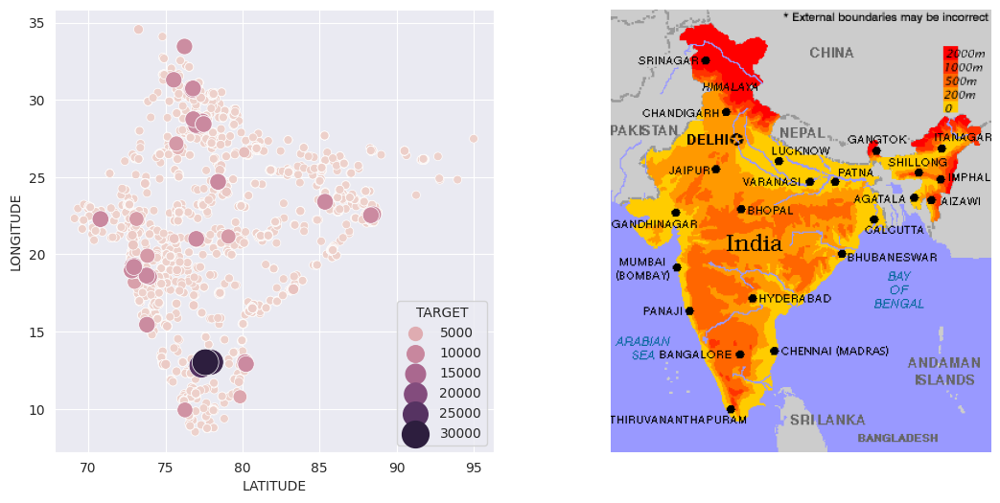

In [19]:
import imageio

img, (scatter_ax, map_ax) = plt.subplots(ncols=2, figsize=(13, 6))

sns.scatterplot(raw_df_india.sort_values('TARGET'), x="LATITUDE", y="LONGITUDE", hue="TARGET", size="TARGET",sizes=(40, 400), alpha=1, ax=scatter_ax)

map_ax.imshow(imageio.imread_v2("https://globalsherpa.org/wp-content/uploads/2011/03/india-map-elevation.gif"))
map_ax.set_axis_off()

plt.show()

## BNK_OR_RK
Далее приводим значение BNK_OR_RK к численным значениям

In [7]:
raw_df_india['BNK'] = [1 if s == "BHK" else 0 for s in raw_df_india.BHK_OR_RK]

### POSTED_BY
Аналогично с поставщиками. Здесь всего 3 значения:

In [8]:
set(raw_df_india.POSTED_BY)

{'Builder', 'Dealer', 'Owner'}

Предположим, что у застройщика самое дешевое жилье, у дилера самое дорогое, тк с наценкой и владелец среднее. На графике далее видим ожидаемую зависимость

In [9]:
raw_df_india['POSTED'] = [1 if s == "Builder" else (2 if s == "Owner" else 3) for s in raw_df_india.POSTED_BY]

Text(0.5, 0, 'POSTED')

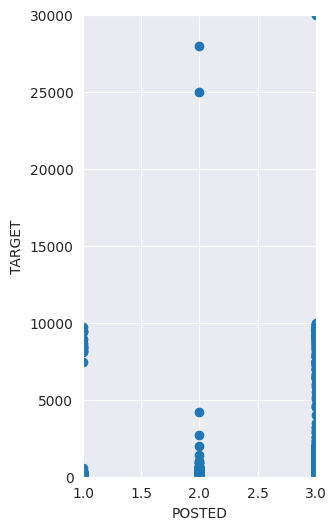

In [13]:
plt.figure(figsize=(3,6))

plt.subplot(1,1,1)
plt.scatter(raw_df_india['POSTED'],raw_df_india['TARGET'])
plt.ylabel('TARGET')
plt.ylim([0,30000])
plt.xlim([1,3])
plt.xlabel('POSTED')

### READY_TO_MOVE и UNDER_CONSTRUCTION
По диаграмме видно, что колонка READY_TO_MOVE совпадает с UNDER_CONSTRUCTION, поэтому имеет смысл убрать одну из них

<Axes: >

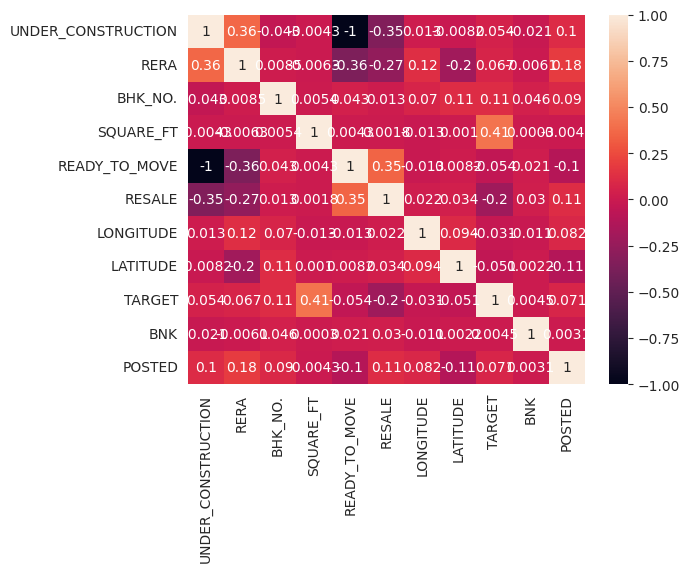

In [10]:
sns.heatmap(raw_df_india.corr(), annot=True)

In [11]:
raw_df_india.drop('UNDER_CONSTRUCTION', axis=1, inplace=True)

### TARGET (цена)

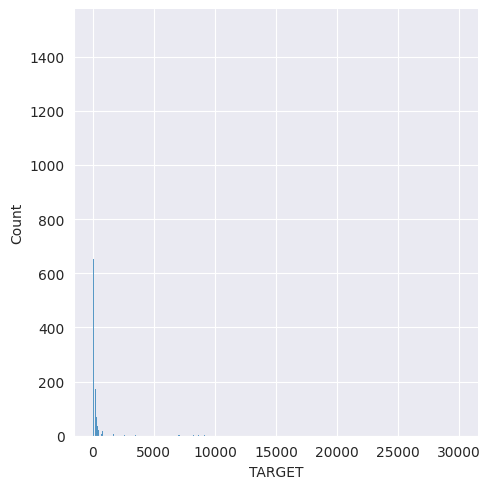

In [12]:
sns.displot(raw_df_india['TARGET'])

Не сильно удобно использовать в таком виде, прологарифмируем

In [13]:
raw_df_india['LOG_TARGET'] = np.log(raw_df_india['TARGET'])

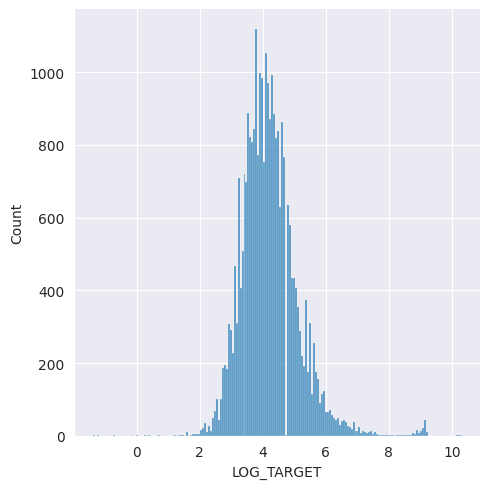

In [14]:
sns.displot(raw_df_india['LOG_TARGET'])

Теперь лучше

### SQUARE_FT
Тут ситуация аналогичная цене:

In [15]:
raw_df_india['LOG_SQUARE_FT'] = np.log(raw_df_india['SQUARE_FT'])

Как мы видим зависимость стала лучше видна

<Axes: >

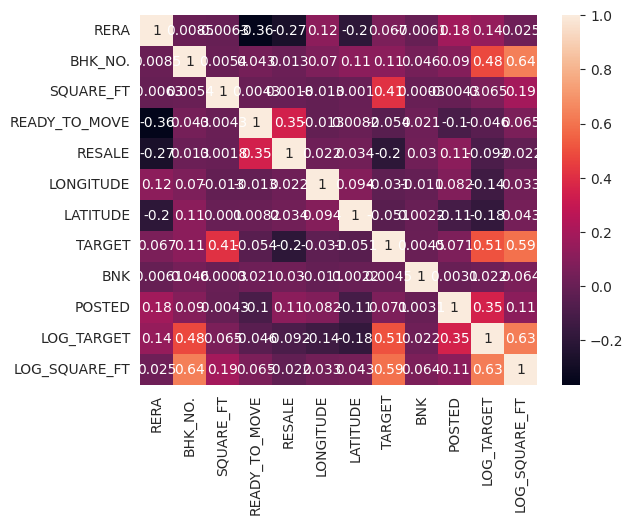

In [16]:
sns.heatmap(raw_df_india.corr(), annot=True)

Как можем заметить появились новые зависимости (BNK_NO) с прологарифмированными значениями и усилились между TARGET и SQUARE_FT

In [17]:
raw_df_india.drop('TARGET', axis=1, inplace=True)
raw_df_india.drop('SQUARE_FT', axis=1, inplace=True)

<Axes: >

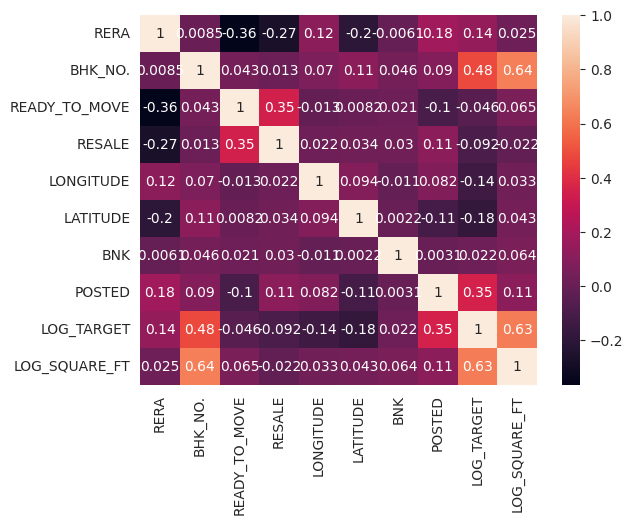

In [18]:
sns.heatmap(raw_df_india.corr(), annot=True)

## Saving

In [19]:
raw_df_india.to_csv('raw_df_india.csv')

In [2]:
df = pd.read_csv('raw_df_india.csv')
#df = raw_df_india

## Реализация Bagging

In [3]:
# use in Bagging and AdaBoost
def _set_random_states(self, estimator):
    states = {}
    for param in estimator.get_params(deep=True):
        if param == "random_state" or param.endswith("__random_state"):
            states[param] = self.random_state_.tomaxint() % 2**32
    return states

In [4]:
class MyBaggingRegressor(BaseEstimator, RegressorMixin):
    """
    Supports с scikit-learn API
    """

    def __init__(self, estimator=None, n_estimators=10, random_state=None):
        self.estimator = estimator
        self.n_estimators = n_estimators
        self.random_state = random_state

    def fit(self, x, y) -> "MyBaggingRegressor":
        self.n_estimators = check_scalar(self.n_estimators, "n_estimators", int, min_val=1)
        self.random_state_ = check_random_state(self.random_state)
        x, y = check_X_y(x, y)
        self.n_features_in_ = x.shape[1]

        self.estimator_ = DecisionTreeRegressor()
        self.estimators_ = []
        for i in range(self.n_estimators):
            estimator = clone(self.estimator_)
            estimator.set_params(**_set_random_states(self, estimator))
            indices = self.random_state_.choice(len(y), size=len(y))
            x_sample, y_sample = x[indices], y[indices]
            estimator.fit(x_sample, y_sample)
            self.estimators_.append(estimator)

        return self

    def predict(self, x):
        check_is_fitted(self)
        x = check_array(x)

        predictions = [estimator.predict(x) for estimator in self.estimators_]
        aggregated = np.mean(predictions, axis=0)
        return aggregated

# check_estimator(MyBaggingRegressor())

## Реализация AdaBoost

In [5]:
class MyAdaBoostRegressor(BaseEstimator, RegressorMixin):
    """
    Supports scikit-learn API
    """

    def __init__(self, estimator=None, n_estimators=50, random_state=None):
        self.estimator = estimator
        self.n_estimators = n_estimators
        self.random_state = random_state

    def fit(self, x, y) -> "MyAdaBoostRegressor":
        self.n_estimators = check_scalar(self.n_estimators, "n_estimators", int, min_val=1)
        self.random_state_ = check_random_state(self.random_state)
        x, y = check_X_y(x, y, y_numeric=True)
        self.n_features_in_ = x.shape[1]

        self.estimator_ = DecisionTreeRegressor(max_depth=3)
        self.estimators_ = []
        self.weights_ = []
        sample_weight = np.full(len(y), fill_value=(1 / len(y)))

        for _ in range(self.n_estimators):
            estimator = clone(self.estimator_)
            estimator.set_params(**_set_random_states(self, estimator))
            predicted = estimator.fit(x, y, sample_weight=sample_weight).predict(x)

            errors = np.abs(predicted - y)
            max_error = np.max(errors)
            if max_error > 0:
                errors /= max_error
            avg_error = np.sum(errors * sample_weight)

            if avg_error == 0:
                self.estimators_.append(estimator)
                self.weights_.append(1.0)
                break
            elif avg_error >= 0.5:
                if len(self.estimators_) == 0:
                    self.estimators_.append(estimator)
                    self.weights_.append(1.0)
                break

            beta = avg_error / (1 - avg_error)
            sample_weight *= np.power(beta, 1 - errors)

            sample_weight /= np.sum(sample_weight)

            self.estimators_.append(estimator)
            self.weights_.append(np.log(1 / beta))
        self.weights_ = np.array(self.weights_)

        return self

    def predict(self, x) -> npt.NDArray:
        check_is_fitted(self)
        x = check_array(x)

        predictions = np.array([estimator.predict(x) for estimator in self.estimators_]).T

        sorted_prediction_ids = np.argsort(predictions, axis=1)
        sorted_weights_cumsum = np.cumsum(self.weights_[sorted_prediction_ids], axis=1)
        is_median_or_above = sorted_weights_cumsum >= (sorted_weights_cumsum[0][-1] / 2)
        median_ids = np.argmax(is_median_or_above, axis=1)
        median_ids = sorted_prediction_ids[np.arange(len(x)), median_ids]

        return predictions[np.arange(len(x)), median_ids]

# check_estimator(MyAdaBoostRegressor())

## Обучение
Используя фреймворк Optuna

In [6]:
import optuna
import pathlib
from sklearn.model_selection import KFold, cross_validate

In [7]:
def train_and_store(data, target, estimator, param_distributions: dict, results_path = pathlib.Path("cv_results.csv")):
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    study = optuna.create_study(sampler=optuna.samplers.BruteForceSampler(999), direction="maximize")
    optuna.logging.set_verbosity(optuna.logging.INFO)

    # кросс-валидации гиперпараметров
    search_model = optuna.integration.OptunaSearchCV(
        estimator,
        param_distributions,
        scoring="r2",
        n_jobs=3,
        n_trials=None,
        random_state=42,
        study=study,
    )

    # кросс-валидации обучаемых параметров
    results = cross_validate(
        search_model,
        data,
        target,
        cv=KFold(shuffle=True, random_state=42),
        scoring=["r2", "neg_mean_absolute_error"],
        n_jobs=4,
        return_estimator=True,
    )

    for fold_i, estimator_in_fold in enumerate(results["estimator"], start=1):
        print(f"Best params #{fold_i}:", estimator_in_fold.best_params_)

    results = pd.DataFrame(results).rename(
        columns={"estimator": "Regressor", "fit_time": "Fit time, s", "score_time": "Score time, s", "test_r2": "R2 on test"}
    )
    results["Regressor"] = estimator.__class__.__name__.removesuffix("Regressor")
    results["MAE on test"] = -results["test_neg_mean_absolute_error"]
    results = results.drop(columns=["test_neg_mean_absolute_error"])
    results.to_csv(results_path, mode="a", header=not results_path.exists())

### Установка данных для обучения

In [8]:
df.head()

,Unnamed: 0,POSTED_BY,RERA,BHK_NO.,BHK_OR_RK,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,BNK,POSTED,LOG_TARGET,LOG_SQUARE_FT
0,0,Owner,0,2,BHK,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,1,2,4.007333,7.170301
1,1,Dealer,0,2,BHK,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,1,3,3.931826,7.150701
2,2,Owner,0,2,BHK,1,1,"Jigani,Bangalore",12.778033,77.632191,1,2,3.761200,6.838576
3,3,Owner,1,2,BHK,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,1,2,4.135167,6.835100
4,4,Dealer,0,2,BHK,0,1,"New Town,Kolkata",22.592200,88.484911,1,3,4.102643,6.906764


In [9]:
df_data = df[['RERA', 'BHK_NO.', 'READY_TO_MOVE', 'RESALE', 'LONGITUDE', 'LATITUDE', 'BNK', 'POSTED', 'LOG_SQUARE_FT']]
df_target = df[['LOG_TARGET']]

### Оборудование

In [10]:
!echo '---------------------- CPU ----------------------'
!lscpu |grep 'Model name'
!echo '-------------------- PYTHON ---------------------'
!python --version
!echo '---------------------- OS -----------------------'
!cat /etc/os-release | grep 'PRETTY_NAME'
!echo '------------------ Total RAM --------------------'
!awk '( $1 == "MemTotal:" ) { print $2/1048576 }' /proc/meminfo

---------------------- CPU ----------------------
Model name:                      12th Gen Intel(R) Core(TM) i7-12700H
-------------------- PYTHON ---------------------
Python 3.9.16
---------------------- OS -----------------------
PRETTY_NAME="Linux Mint 21"
------------------ Total RAM --------------------
15.3572


### Bagging

### Гиперпараметры
Основным параметром для выбора является `n_estimators`. Рекомендуют значение, удвоение которого не приведет к значительному улучшению. Я ограничивалась только временем исполнения.

#### MyBaggingRegressor

In [11]:
%%time

train_and_store(
    df_data,
    df_target,
    MyBaggingRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
    },
    results_path=pathlib.Path("cv_bagging_results.csv"),
)

Best params #1: {'n_estimators': 200}
Best params #2: {'n_estimators': 200}
Best params #3: {'n_estimators': 200}
Best params #4: {'n_estimators': 200}
Best params #5: {'n_estimators': 200}
CPU times: user 681 ms, sys: 1.91 s, total: 2.59 s
Wall time: 2min 35s


#### BaggingRegressor

In [12]:
%%time

from sklearn.ensemble import BaggingRegressor

train_and_store(
    df_data,
    df_target,
    BaggingRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
    },
    results_path=pathlib.Path("cv_bagging_results.csv"),
)

Best params #1: {'n_estimators': 200}
Best params #2: {'n_estimators': 200}
Best params #3: {'n_estimators': 200}
Best params #4: {'n_estimators': 200}
Best params #5: {'n_estimators': 200}
CPU times: user 706 ms, sys: 1.76 s, total: 2.47 s
Wall time: 1min 56s


#### RandomForestRegressor

In [13]:
%%time
from sklearn.ensemble import RandomForestRegressor

train_and_store(
    df_data,
    df_target,
    RandomForestRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
    },
    results_path=pathlib.Path("cv_bagging_results.csv"),
)

Best params #1: {'n_estimators': 200}
Best params #2: {'n_estimators': 200}
Best params #3: {'n_estimators': 200}
Best params #4: {'n_estimators': 200}
Best params #5: {'n_estimators': 200}
CPU times: user 651 ms, sys: 1.96 s, total: 2.61 s
Wall time: 2min


#### Результаты

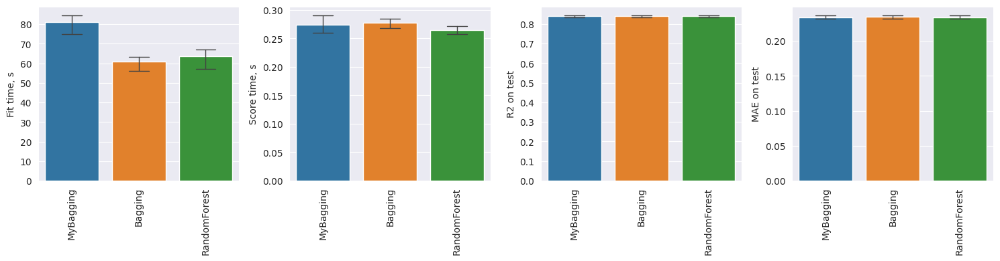

In [14]:
cv_results = pd.read_csv("cv_bagging_results.csv")

img, axs = plt.subplots(ncols=4, figsize=(15, 4))

for y, ax in zip(["Fit time, s", "Score time, s", "R2 on test", "MAE on test"], axs.flatten()):
    sns.barplot(cv_results[["Regressor", y]], x="Regressor", y=y, errwidth=1, capsize=0.3, ax=ax)
    ax.tick_params(axis="x", rotation=90)
    ax.set_xlabel(None)

img.tight_layout()

plt.show()

### Boosting

#### MyAdaBoostRegressor

In [15]:
%%time

train_and_store(
    df_data,
    df_target,
    MyAdaBoostRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'n_estimators': 50}
Best params #2: {'n_estimators': 50}
Best params #3: {'n_estimators': 50}
Best params #4: {'n_estimators': 50}
Best params #5: {'n_estimators': 50}
CPU times: user 71.1 ms, sys: 15.1 ms, total: 86.3 ms
Wall time: 14.8 s


#### AdaBoostRegressor
- `learning_rate` -- меньше значение -> больше случайных деревьев -> больше некоррелированных ошибок предсказания

In [16]:
%%time
from sklearn.ensemble import AdaBoostRegressor

train_and_store(
    df_data,
    df_target,
    AdaBoostRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
        # Выше значение -> больше корректируется ошибок на каждом шаге, но это может привести к переобучению, по умолчанию 1.0
        "learning_rate": optuna.distributions.CategoricalDistribution([0.5, 1, 2]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'n_estimators': 50, 'learning_rate': 0.5}
Best params #2: {'n_estimators': 50, 'learning_rate': 0.5}
Best params #3: {'n_estimators': 50, 'learning_rate': 0.5}
Best params #4: {'n_estimators': 50, 'learning_rate': 0.5}
Best params #5: {'n_estimators': 50, 'learning_rate': 0.5}
CPU times: user 202 ms, sys: 24.5 ms, total: 227 ms
Wall time: 38.6 s


#### GradientBoostingRegressor
- `max_leaf_nodes` -- контролируют глубину каждого дерева в лесу за счет количества конечных узлов

In [17]:
%%time

from sklearn.ensemble import GradientBoostingRegressor

train_and_store(
    df_data,
    df_target,
    GradientBoostingRegressor(random_state=42),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
        # по умолчанию 0.1
        "learning_rate": optuna.distributions.CategoricalDistribution([0.05, 0.1, 0.2]),
        # по умолчанию None
        "max_leaf_nodes": optuna.distributions.CategoricalDistribution([10, 1000, None]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'n_estimators': 200, 'learning_rate': 0.2, 'max_leaf_nodes': None}
Best params #2: {'n_estimators': 200, 'learning_rate': 0.2, 'max_leaf_nodes': 1000}
Best params #3: {'n_estimators': 200, 'learning_rate': 0.2, 'max_leaf_nodes': None}
Best params #4: {'n_estimators': 200, 'learning_rate': 0.2, 'max_leaf_nodes': 1000}
Best params #5: {'n_estimators': 200, 'learning_rate': 0.2, 'max_leaf_nodes': None}
CPU times: user 354 ms, sys: 44.2 ms, total: 399 ms
Wall time: 3min 19s


#### HistGradientBoostingRegressor

In [18]:
%%time

from sklearn.ensemble import HistGradientBoostingRegressor

train_and_store(
    df_data,
    df_target,
    HistGradientBoostingRegressor(random_state=42, early_stopping=True),
    param_distributions={
        # по умолчанию 0.1
        "learning_rate": optuna.distributions.CategoricalDistribution([0.5, 0.1, 0.2]),
        # по умолчанию 31
        "max_leaf_nodes": optuna.distributions.CategoricalDistribution([15, 31, 62, None]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'learning_rate': 0.2, 'max_leaf_nodes': 62}
Best params #2: {'learning_rate': 0.2, 'max_leaf_nodes': 62}
Best params #3: {'learning_rate': 0.2, 'max_leaf_nodes': 62}
Best params #4: {'learning_rate': 0.2, 'max_leaf_nodes': 62}
Best params #5: {'learning_rate': 0.2, 'max_leaf_nodes': 62}
CPU times: user 231 ms, sys: 58.6 ms, total: 289 ms
Wall time: 10min 22s


#### XGBoost

In [19]:
%%time

from xgboost import XGBRegressor

train_and_store(
    df_data,
    df_target,
    XGBRegressor(random_state=42, n_jobs=2),
    param_distributions={
        # Алгоритм построения деревьев
        "tree_method": optuna.distributions.CategoricalDistribution(["exact", "approx", "hist"]),
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
        # по умолчанию 0.3
        "learning_rate": optuna.distributions.CategoricalDistribution([0.1, 0.3, 0.5]),
        # по умолчанию 0; учитывается лишь при tree_method != exact
        "max_leaves": optuna.distributions.CategoricalDistribution([0, 15, 31]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'tree_method': 'exact', 'n_estimators': 200, 'learning_rate': 0.3, 'max_leaves': 31}
Best params #2: {'tree_method': 'exact', 'n_estimators': 200, 'learning_rate': 0.3, 'max_leaves': 31}
Best params #3: {'tree_method': 'exact', 'n_estimators': 200, 'learning_rate': 0.3, 'max_leaves': 31}
Best params #4: {'tree_method': 'exact', 'n_estimators': 200, 'learning_rate': 0.3, 'max_leaves': 31}
Best params #5: {'tree_method': 'exact', 'n_estimators': 200, 'learning_rate': 0.3, 'max_leaves': 31}
CPU times: user 3.09 s, sys: 130 ms, total: 3.22 s
Wall time: 3min 53s


#### LightGBM

In [20]:
%%time

from lightgbm import LGBMRegressor

train_and_store(
    df_data,
    df_target,
    LGBMRegressor(random_state=42, n_jobs=2),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
        # по умолчанию 0.1
        "learning_rate": optuna.distributions.CategoricalDistribution([0.03, 0.1, 0.3]),
        # по умолчанию 31
        "num_leaves": optuna.distributions.CategoricalDistribution([15, 31, 62]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'n_estimators': 200, 'learning_rate': 0.1, 'num_leaves': 62}
Best params #2: {'n_estimators': 200, 'learning_rate': 0.1, 'num_leaves': 62}
Best params #3: {'n_estimators': 200, 'learning_rate': 0.1, 'num_leaves': 62}
Best params #4: {'n_estimators': 200, 'learning_rate': 0.1, 'num_leaves': 62}
Best params #5: {'n_estimators': 200, 'learning_rate': 0.1, 'num_leaves': 62}
CPU times: user 4.05 s, sys: 82.1 ms, total: 4.13 s
Wall time: 20.5 s


#### CatBoost

In [21]:
%%time

from catboost import CatBoostRegressor

train_and_store(
    df_data,
    df_target,
    CatBoostRegressor(random_state=42, thread_count=2),
    param_distributions={
        "n_estimators": optuna.distributions.CategoricalDistribution([50, 100, 200]),
    },
    results_path=pathlib.Path("cv_boosting_results.csv"),
)

Best params #1: {'n_estimators': 200}
Best params #2: {'n_estimators': 200}
Best params #3: {'n_estimators': 200}
Best params #4: {'n_estimators': 200}
Best params #5: {'n_estimators': 200}
CPU times: user 59.4 ms, sys: 17.9 ms, total: 77.3 ms
Wall time: 5.23 s


#### Результаты

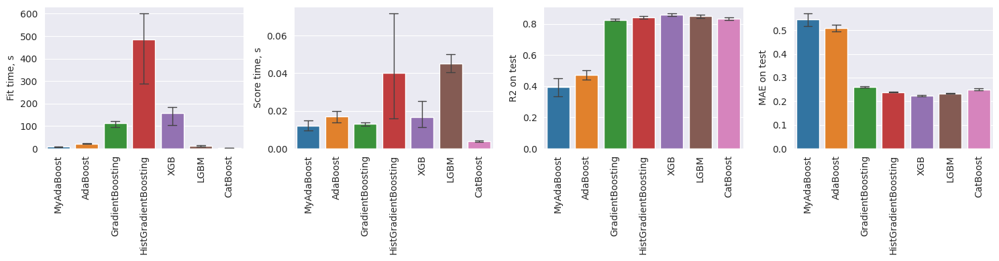

In [22]:
cv_results = pd.read_csv("cv_boosting_results.csv")

img, axs = plt.subplots(ncols=4, figsize=(15, 4))

for y, ax in zip(["Fit time, s", "Score time, s", "R2 on test", "MAE on test"], axs.flatten()):
    sns.barplot(cv_results[["Regressor", y]], x="Regressor", y=y, errwidth=1, capsize=0.3, ax=ax)
    ax.tick_params(axis="x", rotation=90)
    ax.set_xlabel(None)

img.tight_layout()

plt.show()

# Общие результаты

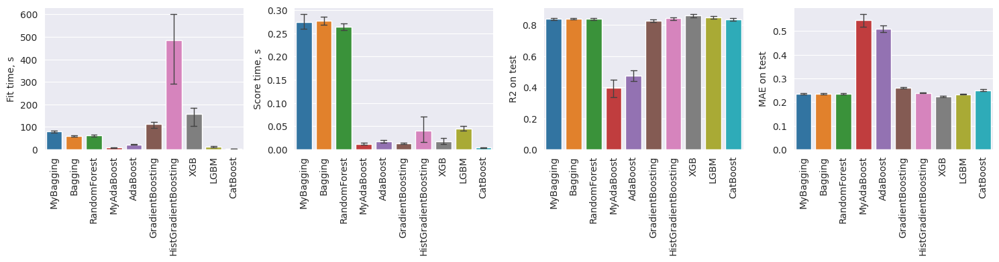

In [23]:
cv_results = pd.read_csv("cv_results.csv")

img, axs = plt.subplots(ncols=4, figsize=(15, 4))

for y, ax in zip(["Fit time, s", "Score time, s", "R2 on test", "MAE on test"], axs.flatten()):
    sns.barplot(cv_results[["Regressor", y]], x="Regressor", y=y, errwidth=1, capsize=0.3, ax=ax)
    ax.tick_params(axis="x", rotation=90)
    ax.set_xlabel(None)

img.tight_layout()

plt.show()